When I started working, I was thinking how to invest my first salary. \
The answer was clear for me: buy a new gravel bike.\
In that period, I was collecting a lot of informations about different bikes, with different settings and specifications.
I literally lost hours and hours by reading blogs and looking for reviews.

The work in the following is conceived for everyone that, as me, wants to buy a new bike.\
I'll support your decision with data. In particular, I will use data extracted from Twitter, and I will develop a sentiment analysis algorithm to automatize the review-reading part.

In particular, this work is divided in three parts:   
1. **Data Extraction** : extract data from twitter
2. **Text Mining**: clean and process the tweets
3. **Sentiment Analysis**: study how the reviews are distributed for each bike model


Below, a pic of my beautiful gravel bike *Gianna* (it's its name).

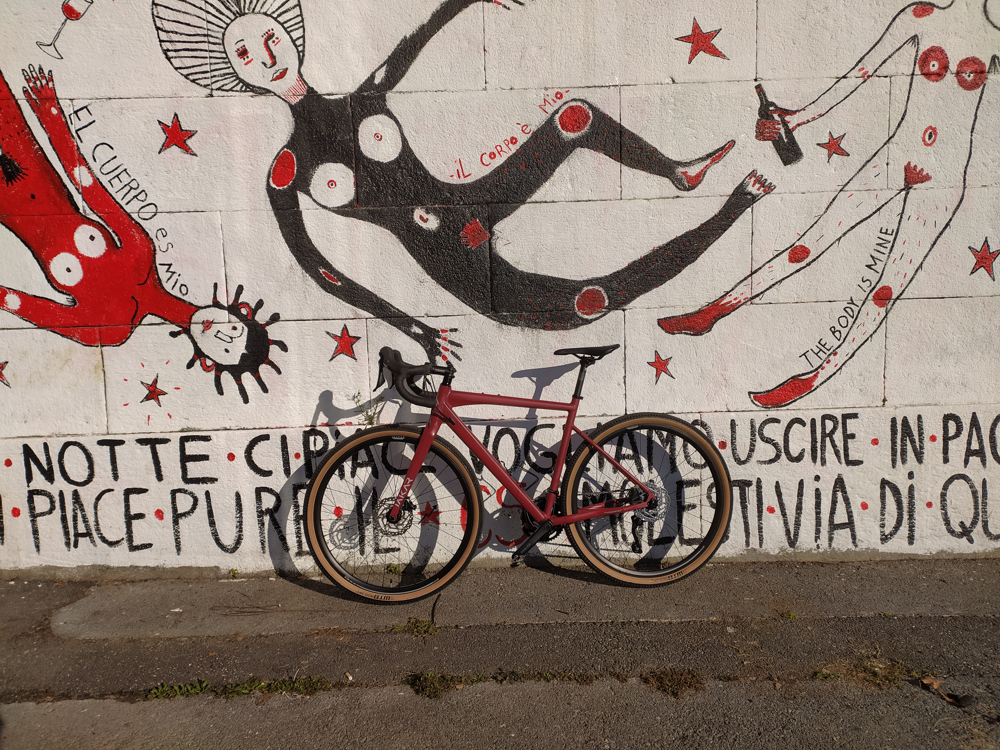

In [5]:
from IPython.display import Image
Image(filename='GiannaMyGravel.jpg') 

# Data Extraction
In this section, we will use *Tweepy*, an easy-to-use Python library for accessing the Twitter API. \
The only requirment to use this library, is to have access to a Twitter Developer Account.

In particular, I will extract all the tweets that contains the hashtags *#CannondaleTopstone*, *#CubeNuroad* and *#MegamoJakar*, which are the bike models on which I was undecided.

The variable *api* we are going to define in the following cell is the entry point for most of the operations we can perform with Twitter.

In [71]:
from datetime import datetime, date, time, timedelta
import tweepy
from tweepy import OAuthHandler
from collections import Counter
import pandas as pd

consumer_key = 'xxxxxxxxxxxxxxxxxxSNL'
consumer_secret = 'xxxxxxxxxxxxxxxxxxxxxxxxxxxgVL'
access_token = 'xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxCXS'
access_secret = 'xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxRL3'

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True)

I am going to look for all tweets containing some key words and hashtags concerning the bicycle models we are analyzing.\
To do that, I am going to use the function *tweet_search*. This function has the limit that searches only for tweets published the last week. To get older tweets I'll have to iterate over the argument *until*, in order to have tweets of the week that ends in the date chosen for the parameter *until*.



In [2]:
#Define a list of dates
dates = pd.date_range(start = "2019-01-01",
                      end = "2022-03-15",
                      freq = "7D")
dates

DatetimeIndex(['2019-01-01', '2019-01-08', '2019-01-15', '2019-01-22',
               '2019-01-29', '2019-02-05', '2019-02-12', '2019-02-19',
               '2019-02-26', '2019-03-05',
               ...
               '2022-01-11', '2022-01-18', '2022-01-25', '2022-02-01',
               '2022-02-08', '2022-02-15', '2022-02-22', '2022-03-01',
               '2022-03-08', '2022-03-15'],
              dtype='datetime64[ns]', length=168, freq='7D')

I define now an empty dataframe that I'll populate with the tweets. \
I'll do this operation for each bicycle model.

In [ ]:
#Define an empty dataframe
db = pd.DataFrame(columns=['username',
                           'description',
                           'location',
                           'following',
                           'followers',
                           'totaltweets',
                           'retweetcount',
                           'text'])

I now write some code to get the tweets and populate the dataframe.
Since this code is pretty slow, I save the results in a csv file.


In [ ]:
#Get tweets containing desired hashtag
tweet_list = []
for key_word in ['#CannondaleTopstone','Cannondale Topstone','CannondaleTopstone']:
    for date in dates:
        for tweet in api.search_tweets(q=key_word, lang = "en", until=str(date.date())):
            username = tweet.user.screen_name
            description = tweet.user.description
            location = tweet.user.location
            following = tweet.user.friends_count
            followers = tweet.user.followers_count
            totaltweets = tweet.user.statuses_count
            retweetcount = tweet.retweet_count
            hashtags = tweet.entities['hashtags']
            text = tweet.text
            ith_tweet = [username, 
                         description,
                         location, 
                         following,
                         followers, 
                         totaltweets,
                         retweetcount, 
                         text]
            tweet_list.append(ith_tweet)
            db.loc[len(db)] = ith_tweet

db.to_csv("*\tweets_CannondaleTopstone.csv")

In [5]:
df_cannondale = pd.read_csv("*\tweets_CannondaleTopstone.csv", 
                             index_col='Unnamed: 0')
print(f"The dataset contains {len(df_cannondale)} tweets, from the beginning of 2019 to now.")
df_cannondale

The dataset contains 15 tweets, from the beginning of 2019 to now.


,username,description,location,following,followers,totaltweets,retweetcount,text
0,ef_caldwell,"Ride fast(ish), live slow. Drink more coffee. ...","Washington, DC",1169,335,1245,0,@anghstudio @RideCannondale Oh heck yeah! Love...
1,stolenbikeschi,"Listing stolen bikes in and around Chicago, Il...","Chicago, IL",491,768,3688,0,STOLEN - Green Cannondale Topstone in Uptown h...
2,velonews,We tell the important stories in competitive c...,"Boulder, CO",1808,152306,58375,0,Current WorldTour rider Emily Newsom finish ju...
3,YvesZlatan47,"1 of 1,2-sport athlete,3rd eye,4 Hunnid,5-star...",That Swanky 47th room,2178,720,152088,3,RT @99spokes: Featured comparison of the day: ...
4,YvesZlatan47,"1 of 1,2-sport athlete,3rd eye,4 Hunnid,5-star...",That Swanky 47th room,2178,720,152088,2,RT @99spokes: Featured comparison of the day: ...
5,GravelBot,Anything & everything Gravel Cycling! From the...,Eating Bytes of Gravel,1355,702,27359,1,RT @SportingGoodsU2: Cannondale Topstone 2019 ...
6,GravelBot,Anything & everything Gravel Cycling! From the...,Eating Bytes of Gravel,1355,702,27359,1,RT @CyclingEquipmeC: Cannondale Topstone 2019 ...
7,SportingGoodsU2,Sporting Goods. Selected Items. Deals. Product...,NaN,0,31,15673,1,Cannondale Topstone 2019 AL Shimano GRX 800 1x...
8,CyclingEquipmeC,Cycling Equipment. Selected Items. Deals. Prod...,NaN,15,33,15843,1,Cannondale Topstone 2019 AL Shimano GRX 800 1x...
9,alanshoebridge,Healthcare communications and marketing profes...,"Portland, OR",1561,598,7501,0,@jahorne My Cannondale Topstone electric road/...


As you can see, unfortunately we can't continue with this project.
When searching for tweets regarding the *Megamo Jakar* gravel bike, the result was even worst: 0 tweets in English from the beginning of 2019.

In [6]:
df_megamo = pd.read_csv("*\tweets_MegamoJakar.csv", 
                 index_col='Unnamed: 0')
print(f"The dataset contains {len(df_megamo)} tweets, from the beginning of 2019 to now.")
df_megamo

The dataset contains 0 tweets, from the beginning of 2019 to now.


,username,description,location,following,followers,totaltweets,retweetcount,text


In [62]:
# def scrape(hashtag, date_since, numtweet):
 
#         # Creating DataFrame using pandas
#         db = pd.DataFrame(columns=['username',
#                                    'description',
#                                    'location',
#                                    'following',
#                                    'followers',
#                                    'totaltweets',
#                                    'retweetcount',
#                                    'text',
#                                    'hashtags'])
 
#         # We are using .Cursor() to search
#         # through twitter for the required tweets.
#         # The number of tweets can be
#         # restricted using .items(number of tweets)
#         tweets = tweepy.Cursor(api.search_tweets,
#                                q = hashtag,
#                                lang ="en",
#                                since_id = date_since,
#                                tweet_mode = 'extended').items(numtweet)
 
 
#         # .Cursor() returns an iterable object. Each item in
#         # the iterator has various attributes
#         # that you can access to
#         # get information about each tweet
#         list_tweets = [tweet for tweet in tweets]
 
#         # Counter to maintain Tweet Count
#         i = 1
 
#         # we will iterate over each tweet in the
#         # list for extracting information about each tweet
#         for tweet in list_tweets:
#                 username = tweet.user.screen_name
#                 description = tweet.user.description
#                 location = tweet.user.location
#                 following = tweet.user.friends_count
#                 followers = tweet.user.followers_count
#                 totaltweets = tweet.user.statuses_count
#                 retweetcount = tweet.retweet_count
#                 hashtags = tweet.entities['hashtags']
 
#                 # Retweets can be distinguished by
#                 # a retweeted_status attribute,
#                 # in case it is an invalid reference,
#                 # except block will be executed
#                 try:
#                         text = tweet.retweeted_status.full_text
#                 except AttributeError:
#                         text = tweet.full_text
#                 hashtext = list()
#                 for j in range(0, len(hashtags)):
#                         hashtext.append(hashtags[j]['text'])
 
#                 # Here we are appending all the
#                 # extracted information in the DataFrame
#                 ith_tweet = [username, description,
#                              location, following,
#                              followers, totaltweets,
#                              retweetcount, text, hashtext]
#                 db.loc[len(db)] = ith_tweet
 
#                 # Function call to print tweet data on screen
#                 printtweetdata(i, ith_tweet)
#                 i = i+1
#         filename = f'tweets_{hashtag}.csv'
 
#         # we will save our database as a CSV file.
#         db.to_csv(filename)
 


,username,description,location,following,followers,totaltweets,retweetcount,text
0,Tuvalum,Estamos cambiando la manera de comprar y vende...,Valencia,84,947,24263,0,#SelecciónTOP \nBicicleta Megamo Jakar por 128...


In [56]:
dates = pd.date_range(start = "2019-01-01",
                      end = "2022-03-15",
                      freq = "7D")
date = dates[-1]
str(date.date())

'2022-03-15'

In [76]:
df = pd.read_csv(r"C:\Users\giulio.olivero\OneDrive - ALTEN Group\NLP\NOTEBOOKS\FILES_OUTPUT\tweets_CannondaleTopstone.csv")
df.head()
3509772676

,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text
0,0,ef_caldwell,"Ride fast(ish), live slow. Drink more coffee. ...","Washington, DC",1169,335,1245,0,@anghstudio @RideCannondale Oh heck yeah! Love...
1,1,stolenbikeschi,"Listing stolen bikes in and around Chicago, Il...","Chicago, IL",491,768,3688,0,STOLEN - Green Cannondale Topstone in Uptown h...
2,2,velonews,We tell the important stories in competitive c...,"Boulder, CO",1808,152306,58375,0,Current WorldTour rider Emily Newsom finish ju...
3,3,YvesZlatan47,"1 of 1,2-sport athlete,3rd eye,4 Hunnid,5-star...",That Swanky 47th room,2178,720,152088,3,RT @99spokes: Featured comparison of the day: ...
4,4,YvesZlatan47,"1 of 1,2-sport athlete,3rd eye,4 Hunnid,5-star...",That Swanky 47th room,2178,720,152088,2,RT @99spokes: Featured comparison of the day: ...
